# source;  https://towardsdatascience.com/a-complete-exploratory-data-analysis-and-visualization-for-text-data-29fb1b96fb6a
# source code ; https://github.com/susanli2016/NLP-with-Python/blob/master/EDA%20and%20visualization%20for%20Text%20Data.ipynb
# data ; https://www.kaggle.com/nicapotato/womens-ecommerce-clothing-reviews

## import

In [43]:
import pandas as pd
import numpy as np
from textblob import TextBlob
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
import warnings 
warnings.filterwarnings('ignore')
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (10.0, 6.0)
import plotly.graph_objs as go
import plotly as py
import cufflinks
pd.options.display.max_columns = 30
from IPython.core.interactiveshell import InteractiveShell
import plotly.figure_factory as ff
InteractiveShell.ast_node_interactivity = 'all'
from plotly.offline import iplot ## iplot
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()
from collections import Counter
import scattertext as st
import spacy
from pprint import pprint
import en_core_web_sm
nlp = spacy.load('en')

Loading BokehJS ...

In [4]:
df = pd.read_csv('data/Womens Clothing E-Commerce Reviews.csv')

In [5]:
df.head()

,Unnamed: 0,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


- Remove the 'title' feature.

- Remove the rows where 'Review Text' were missing.

- Clean 'Review Text' column.

- Using _TextBlob_ to calculate sentiment polarity which lies in the range of [-1, 1] where 1 means positive sentiment and -1 means a negative sentiment.

- Create new feature for the length of the review.

- Create new feature for the word count of the review.


In [13]:
# https://textblob.readthedocs.io/en/dev/
from textblob import TextBlob

In [21]:
df.tail()

,Clothing ID,Age,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
23481,1104,34,I was very happy to snag this dress at such a ...,5,1,0,General Petite,Dresses,Dresses
23482,862,48,"It reminds me of maternity clothes. soft, stre...",3,1,0,General Petite,Tops,Knits
23483,1104,31,"This fit well, but the top was very see throug...",3,0,1,General Petite,Dresses,Dresses
23484,1084,28,I bought this dress for a wedding i have this ...,3,1,2,General,Dresses,Dresses
23485,1104,52,This dress in a lovely platinum is feminine an...,5,1,22,General Petite,Dresses,Dresses


In [23]:
#df.drop('Unnamed: 0', axis=1, inplace=True)
#df.drop('Title', axis=1, inplace=True)
df = df[~df['Review Text'].isnull()]

def preprocess(ReviewText):
    ReviewText = ReviewText.str.replace("(<br/>)", "")
    ReviewText = ReviewText.str.replace('(<a).*(>).*(</a>)', '')
    ReviewText = ReviewText.str.replace('(&amp)', '')
    ReviewText = ReviewText.str.replace('(&gt)', '')
    ReviewText = ReviewText.str.replace('(&lt)', '')
    ReviewText = ReviewText.str.replace('(\xa0)', ' ')  
    return ReviewText
df['Review Text'] = preprocess(df['Review Text'])

df['polarity'] = df['Review Text'].map(lambda text: TextBlob(text).sentiment.polarity)
df['review_len'] = df['Review Text'].astype(str).apply(len)
df['word_count'] = df['Review Text'].apply(lambda x: len(str(x).split()))

To preview whether the sentiment polarity score works wll, we randomly select 5 review with the highest sentiment polarity score (1):

In [24]:
# positive version
print('5 random reviews with the highest positive sentiment polarity: \n')
cl = df.loc[df.polarity == 1, ['Review Text']].sample(5).values 
for c in cl:
    print(c[0])

5 random reviews with the highest positive sentiment polarity: 

Dress is awesome and makes you look skinnier.
Great dress for vacations!
Made my wedding outfit perfect!
This cover-up is perfect for the beach or the pool. it is see through.
Fits perfect.


In [25]:
# neutral version
print('5 random reviews with the most neutral sentiment(zero) polarity: \n')
cl = df.loc[df.polarity == 0, ['Review Text']].sample(5).values
for c in cl:
    print(c[0])

5 random reviews with the most neutral sentiment(zero) polarity: 

I don't like how short it is in the back.
i also prefer a solid vs. slubby material, 
back it goes.
I tried on xs petites as someone had returned it . i didn't find that it ran small, it was ok on me. i am not sure if the regular size would work but i didn't end up purchasing this today as the color was jsut so-so on my skin tone.

likes: contrast and detail in ruffle, romantic

dislikes: the tag pulled on the fabric a bit and you could tell, so the fabric seemed fragile.
Too pricey for the quality of this imported product.
I was initially attracted to the colors
If you have an hourglass figure this dress accentuates your curves. i do need to wear a tank underneath as dress is low cut.


In [26]:
# negative version
print('2 reviews with the most negative polarity: \n')
cl = df.loc[df.polarity == -0.97500000000000009, ['Review Text']].sample(2).values
for c in cl:
    print(c[0])

2 reviews with the most negative polarity: 

Received this product with a gaping hole in it. very disappointed in the quality and the quality control at the warehouse
Cut out design, no seems or hems.
 very disappointed in retailer


## Univariate visualization with Plotly

Single-variable or univariate visualization is the simplest type of visualization which consists of observations on only a single characterstic or attribute. Univariate visualization includes histogram, bar plots and line charts.

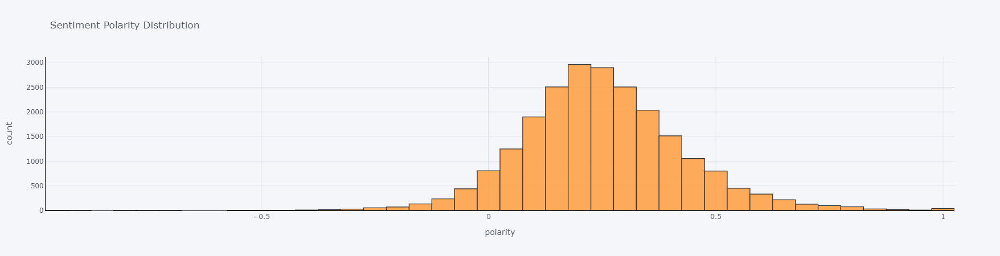

In [54]:
df['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

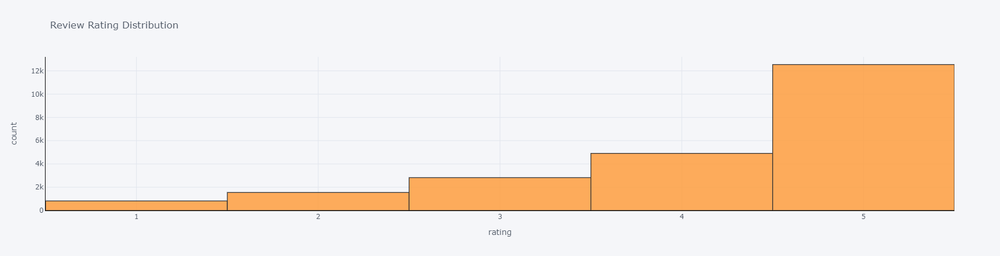

In [55]:
df['Rating'].iplot(
kind='hist',
xTitle='rating',
linecolor='black',
yTitle='count',
title='Review Rating Distribution')

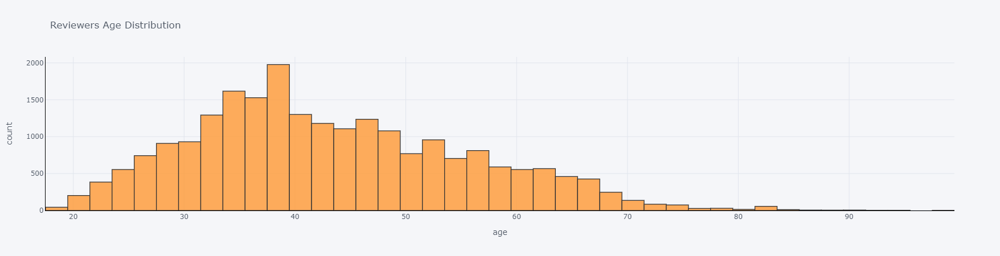

In [56]:
df['Age'].iplot(
kind='hist',
bins=50,
xTitle='age',
linecolor='black',
yTitle='count',
title='Reviewers Age Distribution')

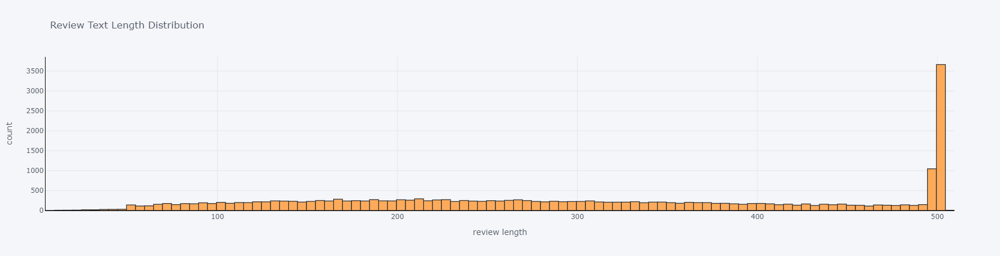

In [57]:
df['review_len'].iplot(
kind='hist',
bins=100,
xTitle='review length',
linecolor='black',
yTitle='count',
title='Review Text Length Distribution')

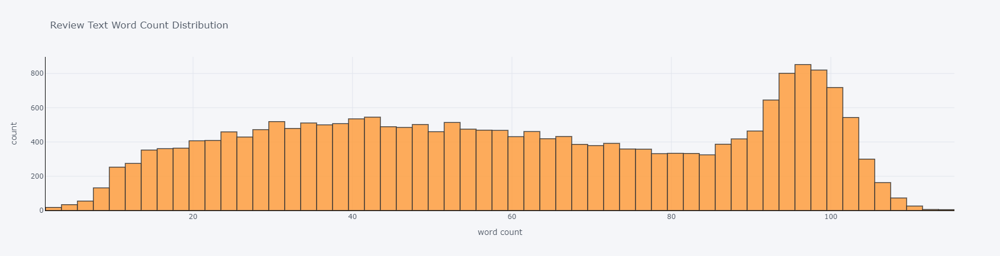

In [58]:
df['word_count'].iplot(
kind='hist',
bins=100,
xTitle='word count',
linecolor='black',
yTitle='count',
title='Review Text Word Count Distribution')

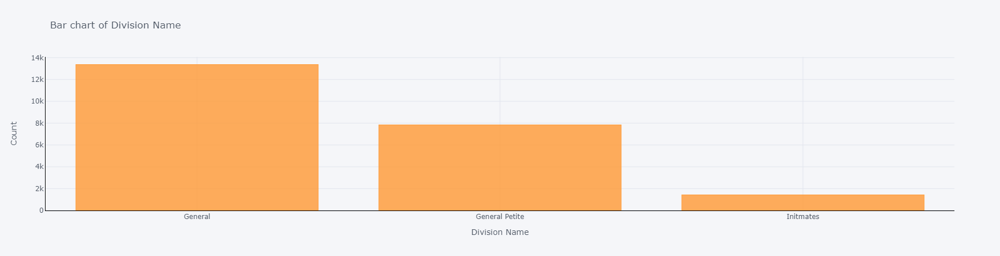

In [61]:
df.groupby('Division Name').count()['Clothing ID'].iplot(
    kind='bar', 
    linecolor='black', 
    opacity=0.8, 
    title = 'Bar chart of Division Name', 
    xTitle='Division Name',
    yTitle='Count',)

# opacity -> transparency 

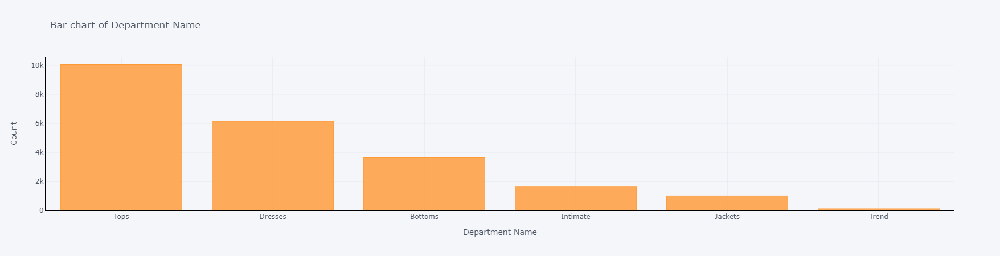

In [63]:
df.groupby('Department Name').count()['Clothing ID'].sort_values(ascending=False).iplot(
kind = 'bar',
linecolor = 'black',
opacity = 0.8,
title = 'Bar chart of Department Name',
xTitle = 'Department Name',
yTitle = 'Count')

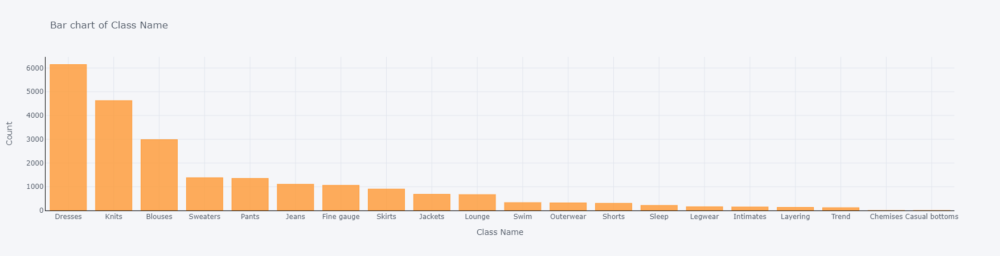

In [67]:
df.groupby('Class Name').count()['Clothing ID'].sort_values(ascending=False).iplot(
kind = 'bar',
linecolor='black',
opacity=0.8,
xTitle='Class Name',
yTitle='Count',
title = 'Bar chart of Class Name')

## The distribution of top unigrams before removing stop words

the 76166
it 49284
and 49009
is 30641
this 25762
to 24583
in 20723
but 16556
on 15328
for 14000
of 13429
with 12803
was 12221
so 12023
my 11028
dress 10567
that 10014
not 9799
love 8951
size 8772


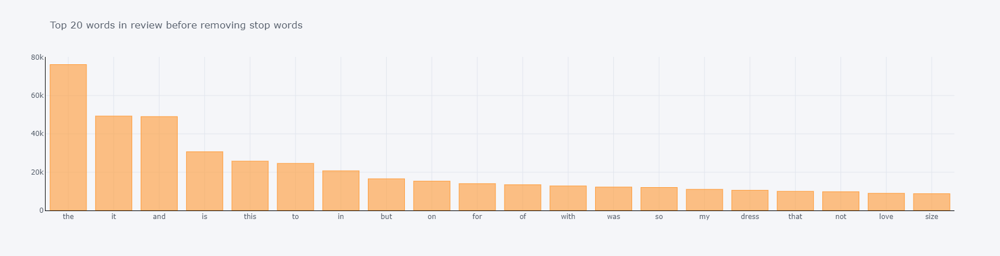

In [69]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_words(df['Review Text'], 20)
for word, freq in common_words:
    print(word, freq)
df1 = pd.DataFrame(common_words, columns = ['ReviewText', 'count'])
df1.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
kind='bar',
linecolor='black',
title = 'Top 20 words in review before removing stop words')

## The distribution of top unigrams after removing stop words

dress 10567
love 8951
size 8772
fit 7325
like 7149
wear 6439
great 6117
just 5608
fabric 4798
small 4729
color 4605
look 4039
really 3925
ordered 3850
little 3775
perfect 3774
flattering 3519
soft 3343
comfortable 3060
cute 3042


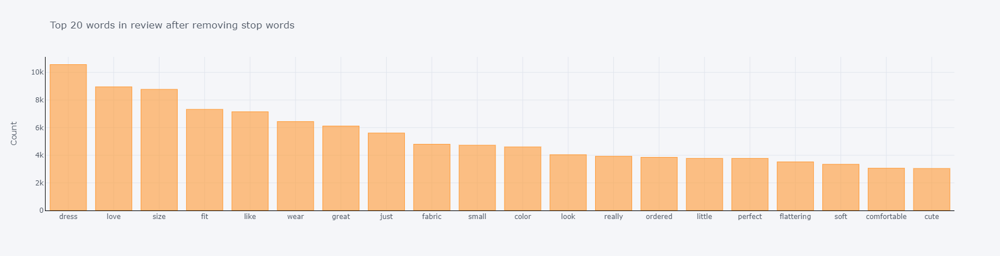

In [70]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(stop_words = 'english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_words(df['Review Text'], 20)
for word, freq in common_words:
    print(word, freq)
df2 = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
df2.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 words in review after removing stop words')

## bigram compare to whether there are existing 'stopwords'

in the 7169
it is 6169
and the 5614
this dress 4758
on the 4338
of the 3932
and it 3725
it was 3100
this top 2939
this is 2750
the fabric 2655
love the 2641
love this 2333
is very 2321
to wear 2267
but it 2196
the dress 2180
with the 2057
for me 2026
but the 1974


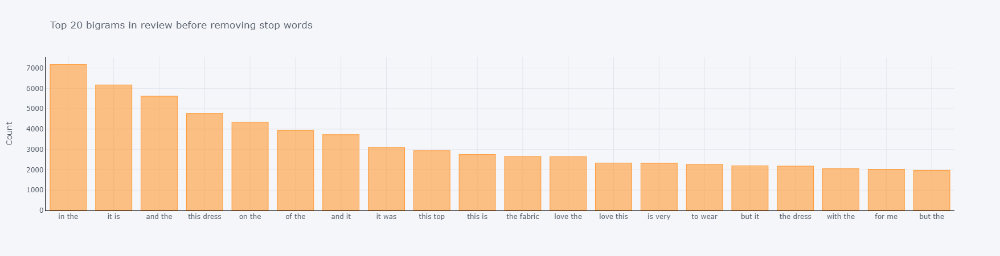

In [73]:
def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2,2)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_bigram(df['Review Text'], 20)
for word, freq in common_words:
    print(word, freq)
df3 = pd.DataFrame(common_words, columns = ['ReviewText', 'count'])
df3.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', 
    yTitle='Count', 
    linecolor='black', 
    title='Top 20 bigrams in review before removing stop words')

true size 1347
love dress 766
usually wear 691
looks great 620
fit perfectly 609
size small 540
fits perfectly 489
usual size 479
look like 425
just right 423
ordered size 375
love love 374
looks like 373
runs large 367
highly recommend 365
super cute 363
wear size 361
fabric soft 350
feel like 349
fit great 348


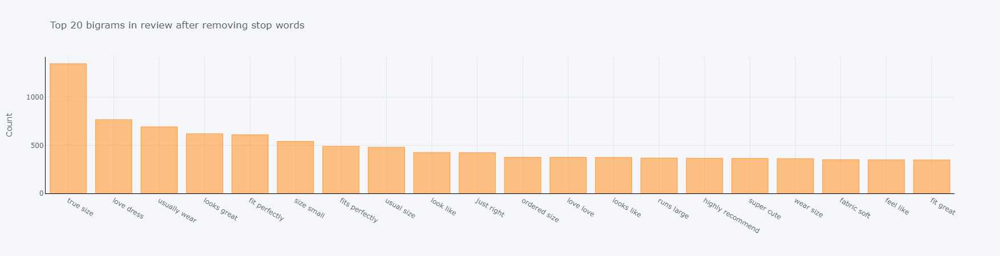

In [74]:
def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_bigram(df['Review Text'], 20)
for word, freq in common_words:
    print(word, freq)
df4 = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
df4.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', 
    yTitle='Count', 
    linecolor='black', 
    title='Top 20 bigrams in review after removing stop words')


## Trigram compare to whether there are existing 'stopwords'

true to size 1316
the fabric is 1291
this dress is 1115
the material is 886
in the store 728
on the model 725
the fit is 693
this top is 667
the color is 625
love this dress 605
tried it on 574
it is very 572
and it is 569
and it was 537
in the back 528
up or down 518
the dress is 511
to wear it 490
love this top 480
the colors are 472


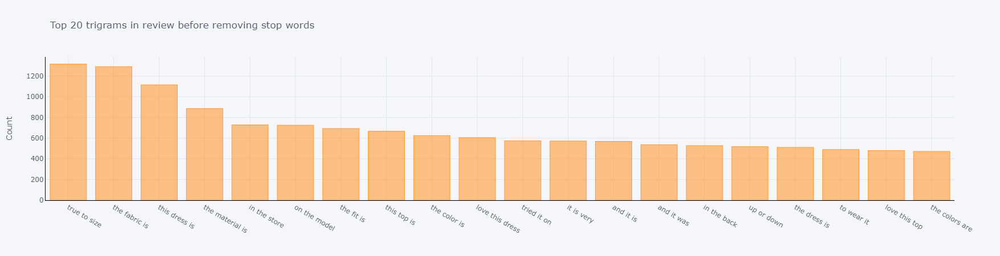

In [75]:
def get_top_n_trigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(3, 3)).fit(corpus) ##
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)  
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_trigram(df['Review Text'], 20)
for word, freq in common_words:
    print(word, freq)
df5 = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
df5.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 trigrams in review before removing stop words')

fits true size 280
fit true size 229
runs true size 148
love love love 143
usually wear size 136
ordered usual size 107
does run large 95
really wanted love 94
wanted love dress 88
usually wear small 80
small fit perfectly 77
looks great jeans 70
fit like glove 69
usually wear medium 68
normally wear size 68
small fits perfectly 65
size fit perfectly 65
fits like glove 65
usual size small 64
usually wear xs 63


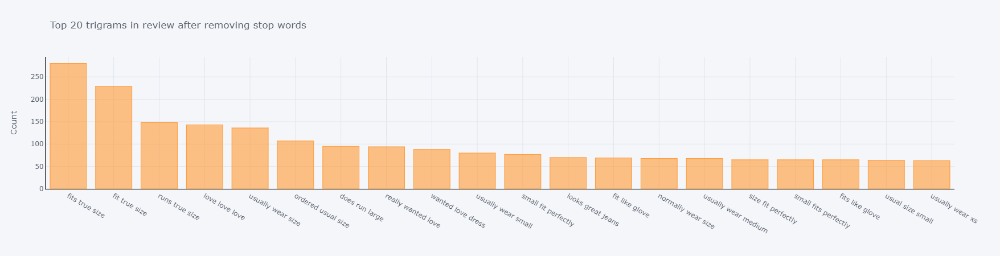

In [76]:
def get_top_n_trigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(3, 3), stop_words='english').fit(corpus) ##
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_trigram(df['Review Text'], 20)
for word, freq in common_words:
    print(word, freq)
df6 = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
df6.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 trigrams in review after removing stop words')


## The distribution of top part-of-speech tags of review corpus

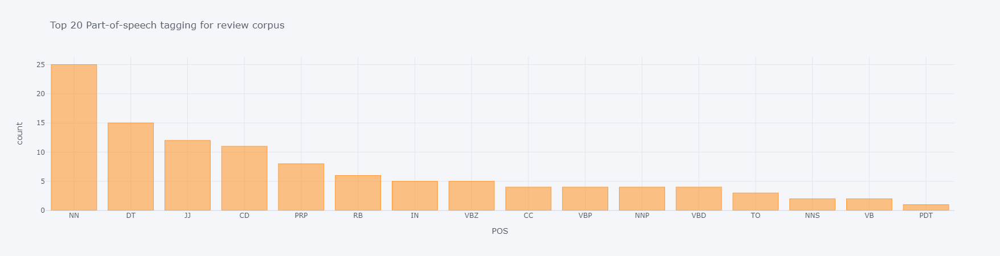

In [77]:
blob = TextBlob(str(df['Review Text']))
pos_df = pd.DataFrame(blob.tags, columns = ['word' , 'pos'])
pos_df = pos_df.pos.value_counts()[:20]
pos_df.iplot(
    kind='bar',
    xTitle='POS',
    yTitle='count', 
    title='Top 20 Part-of-speech tagging for review corpus')

### graph color palette ; https://www.color-hex.com/color-palette/18130

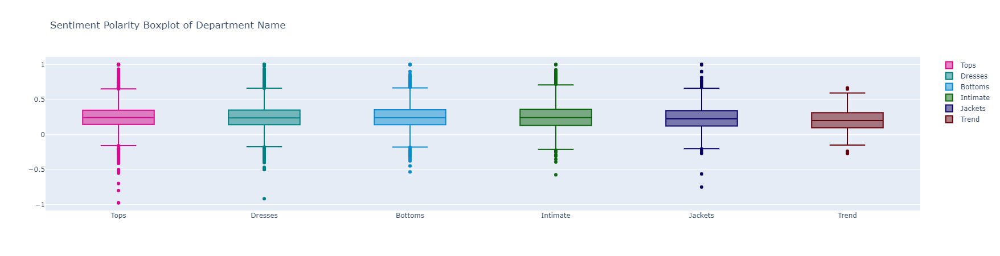

In [78]:
y0 = df.loc[df['Department Name'] == 'Tops']['polarity']
y1 = df.loc[df['Department Name'] == 'Dresses']['polarity']
y2 = df.loc[df['Department Name'] == 'Bottoms']['polarity']
y3 = df.loc[df['Department Name'] == 'Intimate']['polarity']
y4 = df.loc[df['Department Name'] == 'Jackets']['polarity']
y5 = df.loc[df['Department Name'] == 'Trend']['polarity']

trace0 = go.Box(
    y=y0,
    name = 'Tops',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=y1,
    name = 'Dresses',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
trace2 = go.Box(
    y=y2,
    name = 'Bottoms',
    marker = dict(
        color = 'rgb(10, 140, 208)',
    )
)
trace3 = go.Box(
    y=y3,
    name = 'Intimate',
    marker = dict(
        color = 'rgb(12, 102, 14)',
    )
)
trace4 = go.Box(
    y=y4,
    name = 'Jackets',
    marker = dict(
        color = 'rgb(10, 0, 100)',
    )
)
trace5 = go.Box(
    y=y5,
    name = 'Trend',
    marker = dict(
        color = 'rgb(100, 0, 10)',
    )
)
data = [trace0, trace1, trace2, trace3, trace4, trace5]
layout = go.Layout(
    title = "Sentiment Polarity Boxplot of Department Name"
)

fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "Sentiment Polarity Boxplot of Department Name")

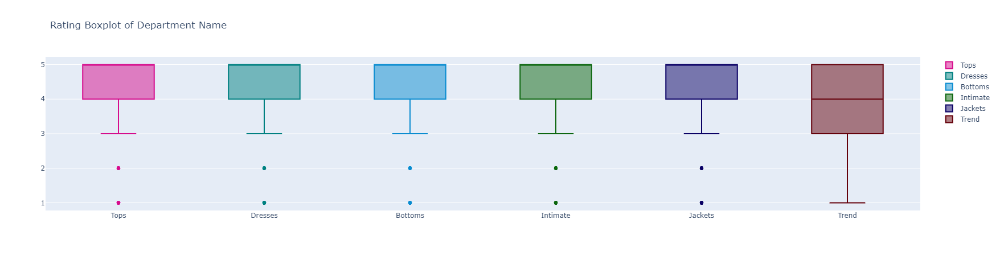

In [79]:
y0 = df.loc[df['Department Name'] == 'Tops']['Rating']
y1 = df.loc[df['Department Name'] == 'Dresses']['Rating']
y2 = df.loc[df['Department Name'] == 'Bottoms']['Rating']
y3 = df.loc[df['Department Name'] == 'Intimate']['Rating']
y4 = df.loc[df['Department Name'] == 'Jackets']['Rating']
y5 = df.loc[df['Department Name'] == 'Trend']['Rating']

trace0 = go.Box(
    y=y0,
    name = 'Tops',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=y1,
    name = 'Dresses',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
trace2 = go.Box(
    y=y2,
    name = 'Bottoms',
    marker = dict(
        color = 'rgb(10, 140, 208)',
    )
)
trace3 = go.Box(
    y=y3,
    name = 'Intimate',
    marker = dict(
        color = 'rgb(12, 102, 14)',
    )
)
trace4 = go.Box(
    y=y4,
    name = 'Jackets',
    marker = dict(
        color = 'rgb(10, 0, 100)',
    )
)
trace5 = go.Box(
    y=y5,
    name = 'Trend',
    marker = dict(
        color = 'rgb(100, 0, 10)',
    )
)
data = [trace0, trace1, trace2, trace3, trace4, trace5]
layout = go.Layout(
    title = "Rating Boxplot of Department Name"
)

fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "Rating Boxplot of Department Name")

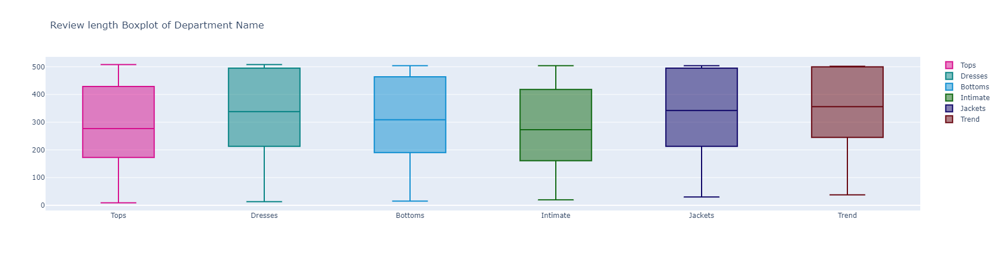

In [80]:
y0 = df.loc[df['Department Name'] == 'Tops']['review_len']
y1 = df.loc[df['Department Name'] == 'Dresses']['review_len']
y2 = df.loc[df['Department Name'] == 'Bottoms']['review_len']
y3 = df.loc[df['Department Name'] == 'Intimate']['review_len']
y4 = df.loc[df['Department Name'] == 'Jackets']['review_len']
y5 = df.loc[df['Department Name'] == 'Trend']['review_len']

trace0 = go.Box(
    y=y0,
    name = 'Tops',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=y1,
    name = 'Dresses',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
trace2 = go.Box(
    y=y2,
    name = 'Bottoms',
    marker = dict(
        color = 'rgb(10, 140, 208)',
    )
)
trace3 = go.Box(
    y=y3,
    name = 'Intimate',
    marker = dict(
        color = 'rgb(12, 102, 14)',
    )
)
trace4 = go.Box(
    y=y4,
    name = 'Jackets',
    marker = dict(
        color = 'rgb(10, 0, 100)',
    )
)
trace5 = go.Box(
    y=y5,
    name = 'Trend',
    marker = dict(
        color = 'rgb(100, 0, 10)',
    )
)
data = [trace0, trace1, trace2, trace3, trace4, trace5]
layout = go.Layout(
    title = "Review length Boxplot of Department Name"
)

fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "Review Length Boxplot of Department Name")

## Bivariate visualization with Plotly

Bivariate visualization is a type of visualization that consists two features at a time. It describes association or relationship between two features.

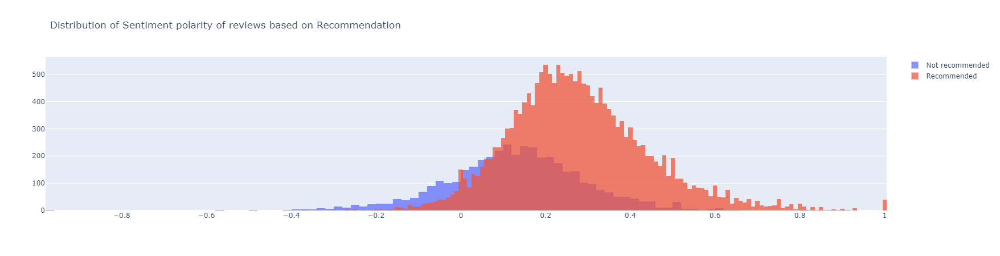

In [81]:
x1 = df.loc[df['Recommended IND'] == 1, 'polarity']
x0 = df.loc[df['Recommended IND'] == 0, 'polarity']

trace1 = go.Histogram(
x=x0, name ='Not recommended',
opacity=0.75)

trace2 = go.Histogram(
x=x1, name = 'Recommended',
opacity=0.75)

data = [trace1, trace2]
layout = go.Layout(barmode='overlay', title='Distribution of Sentiment polarity of reviews based on Recommendation')
fig = go.Figure(data=data, layout=layout)

iplot(fig, filename='overlaid histogram')

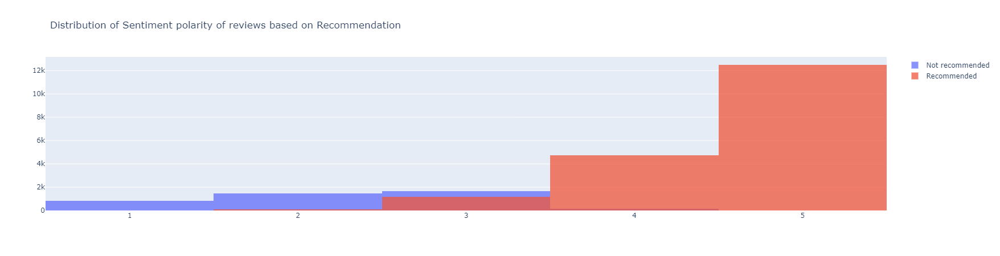

In [82]:
x1 = df.loc[df['Recommended IND'] == 1, 'Rating']
x0 = df.loc[df['Recommended IND'] == 0, 'Rating']

trace1 = go.Histogram(
    x=x0, name='Not recommended',
    opacity=0.75
)
trace2 = go.Histogram(
    x=x1, name = 'Recommended',
    opacity=0.75
)

data = [trace1, trace2]
layout = go.Layout(barmode='overlay', title='Distribution of Sentiment polarity of reviews based on Recommendation')
fig = go.Figure(data=data, layout=layout)

iplot(fig, filename='overlaid histogram')

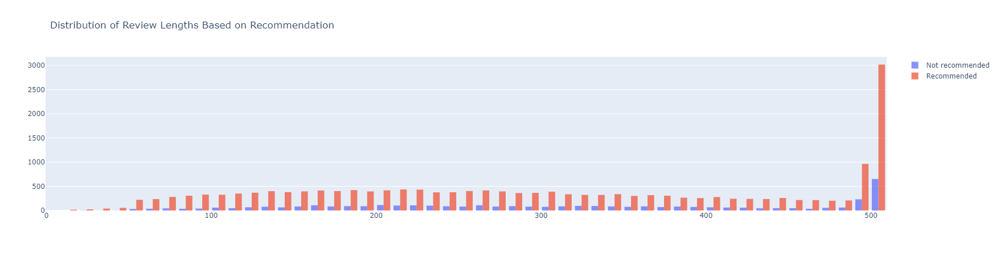

In [83]:
x1 = df.loc[df['Recommended IND'] == 1, 'review_len']
x0 = df.loc[df['Recommended IND'] == 0, 'review_len']

trace1 = go.Histogram(
    x=x0, name='Not recommended',
    opacity=0.75
)
trace2 = go.Histogram(
    x=x1, name = 'Recommended',
    opacity=0.75
)

data = [trace1, trace2]
layout = go.Layout(barmode = 'group', title='Distribution of Review Lengths Based on Recommendation')
fig = go.Figure(data=data, layout=layout)

iplot(fig, filename='stacked histogram')

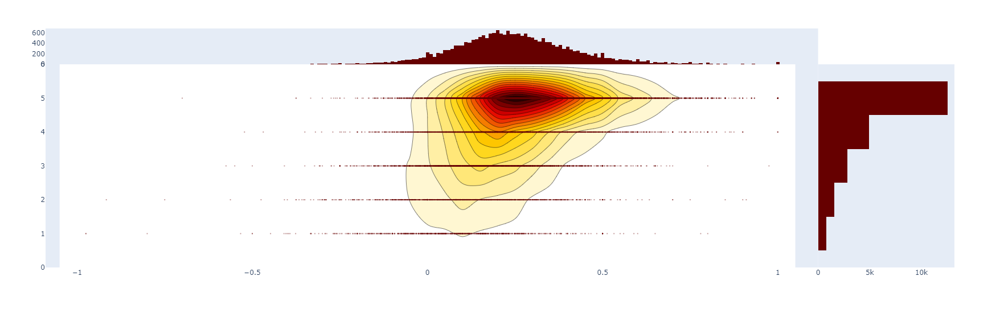

In [84]:
trace1 = go.Scatter(
    x=df['polarity'], y=df['Rating'], mode='markers', name='points',
    marker=dict(color='rgb(102,0,0)', size=2, opacity=0.4)
)
trace2 = go.Histogram2dContour(
    x=df['polarity'], y=df['Rating'], name='density', ncontours=20,
    colorscale='Hot', reversescale=True, showscale=False
)
trace3 = go.Histogram(
    x=df['polarity'], name='Sentiment polarity density',
    marker=dict(color='rgb(102,0,0)'),
    yaxis='y2'
)
trace4 = go.Histogram(
    y=df['Rating'], name='Rating density', marker=dict(color='rgb(102,0,0)'),
    xaxis='x2'
)
data = [trace1, trace2, trace3, trace4]

layout = go.Layout(
    showlegend=False,
    autosize=False,
    width=600,
    height=550,
    xaxis=dict(
        domain=[0, 0.85],
        showgrid=False,
        zeroline=False
    ),
    yaxis=dict(
        domain=[0, 0.85],
        showgrid=False,
        zeroline=False
    ),
    margin=dict(
        t=50
    ),
    hovermode='closest',
    bargap=0,
    xaxis2=dict(
        domain=[0.85, 1],
        showgrid=False,
        zeroline=False
    ),
    yaxis2=dict(
        domain=[0.85, 1],
        showgrid=False,
        zeroline=False
    )
)

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='2dhistogram-2d-density-plot-subplots')

## Finding characteristic terms and their associations

_scattertext_ , _spaCy_

procedure ; 

First, we need to turn the data frame into a Scattertext Corpus.

To look for differences in department name, set the category_colparameter to 'Department Names', and use the review present in the Review Text column, to analyze by setting the text col parameter. 

Finally, pass a spaCy model in to the nlp argument and call build() to construct the corpus.

In [85]:
corpus = st.CorpusFromPandas(df, category_col='Department Name' , text_col = 'Review Text', nlp=nlp).build()
print(list(corpus.get_scaled_f_scores_vs_background().index[:10]))

['flattering', 'sweater', 'boxy', 'flowy', 'leggings', 'xs', 'waist', 'dress', 'blouse', 'comfy']


In [87]:
term_freq_df = corpus.get_term_freq_df()
term_freq_df['Tops Score'] = corpus.get_scaled_f_scores('Tops')
pprint(list(term_freq_df.sort_values(by='Tops Score', ascending=False).index[:10]))

['this shirt',
 'the shirt',
 'this top',
 'this blouse',
 'shirt is',
 'this sweater',
 'sweater is',
 'blouse',
 'the sweater',
 'shirt']


In [88]:
term_freq_df['Dresses Score'] = corpus.get_scaled_f_scores('Dresses')
pprint(list(term_freq_df.sort_values(by='Dresses Score', ascending=False).index[:10]))

['this dress',
 'the dress',
 'dress is',
 'dress in',
 'dress for',
 'dress',
 'dress and',
 'dress was',
 'dress to',
 'dresses']


In [95]:
term_freq_df.head()
term_freq_df.head().sort_values(by='Tops Score',ascending=False)

,Intimate freq,Dresses freq,Bottoms freq,Tops freq,Jackets freq,Trend freq,Tops Score,Dresses Score
term,,,,,,,,
absolutely,59,274,128,300,44,5,0.122129,0.863094
wonderful,16,75,54,119,27,5,0.259702,0.233107
silky,7,40,26,40,10,3,0.344767,0.612361
and,3394,14295,8153,20601,2227,279,0.857029,0.841618
sexy,57,93,21,45,1,0,0.203093,0.767371


,Intimate freq,Dresses freq,Bottoms freq,Tops freq,Jackets freq,Trend freq,Tops Score,Dresses Score
term,,,,,,,,
and,3394,14295,8153,20601,2227,279,0.857029,0.841618
silky,7,40,26,40,10,3,0.344767,0.612361
wonderful,16,75,54,119,27,5,0.259702,0.233107
sexy,57,93,21,45,1,0,0.203093,0.767371
absolutely,59,274,128,300,44,5,0.122129,0.863094


In [97]:
term_freq_df.nunique()

Intimate freq     242
Dresses freq      538
Bottoms freq      389
Tops freq         657
Jackets freq      204
Trend freq         67
Tops Score       4783
Dresses Score    4536
dtype: int64

## Topic Modeling Review Text

_Latent SEmantic Analysis_

- Generateing our document-term matrix from review text to a matrix of TF-IDF features.

- LSA model replaces raw counts in the document-term matrix with a TF-IDF score.

- Perform dimensionality reduction on the document-term matrix using truncated SVD.

#### truncated SVD ; https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.TruncatedSVD.html
This transformer performs linear dimensionality reduction by means of truncated singular value decomposition (SVD). Contrary to PCA, this estimator does not center the data before computing the singular value decomposition. This means it can work with sparse matrices efficiently.

In [117]:
reindexed_data = df['Review Text']
tfidf_vectorizer = TfidfVectorizer(stop_words='english', use_idf=True, smooth_idf=True)
reindexed_data = reindexed_data.values
document_term_matrix = tfidf_vectorizer.fit_transform(reindexed_data)

In [118]:
n_topics = 6
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(document_term_matrix)

In [119]:
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

In [120]:
lsa_keys = get_keys(lsa_topic_matrix)
lsa_categories, lsa_counts = keys_to_counts(lsa_keys)

In [121]:
def get_top_n_words(n, keys, document_term_matrix, tfidf_vectorizer):
    '''
    returns a list of n_topic strings, where each string contains the n most common 
    words in a predicted category, in order
    '''
    top_word_indices = []
    for topic in range(n_topics):
        temp_vector_sum = 0
        for i in range(len(keys)):
            if keys[i] == topic:
                temp_vector_sum += document_term_matrix[i]
        temp_vector_sum = temp_vector_sum.toarray()
        top_n_word_indices = np.flip(np.argsort(temp_vector_sum)[0][-n:],0)
        top_word_indices.append(top_n_word_indices)   
    top_words = []
    for topic in top_word_indices:
        topic_words = []
        for index in topic:
            temp_word_vector = np.zeros((1,document_term_matrix.shape[1]))
            temp_word_vector[:,index] = 1
            the_word = tfidf_vectorizer.inverse_transform(temp_word_vector)[0][0]
            topic_words.append(the_word.encode('ascii').decode('utf-8'))
        top_words.append(" ".join(topic_words))         
    return top_words

In [122]:
top_n_words_lsa = get_top_n_words(3, lsa_keys, document_term_matrix, tfidf_vectorizer)

for i in range(len(top_n_words_lsa)):
    print("Topic {}: ".format(i+1), top_n_words_lsa[i])

Topic 1:  love dress size
Topic 2:  dress beautiful love
Topic 3:  love great comfortable
Topic 4:  size small runs
Topic 5:  shirt cute love
Topic 6:  great pants fit


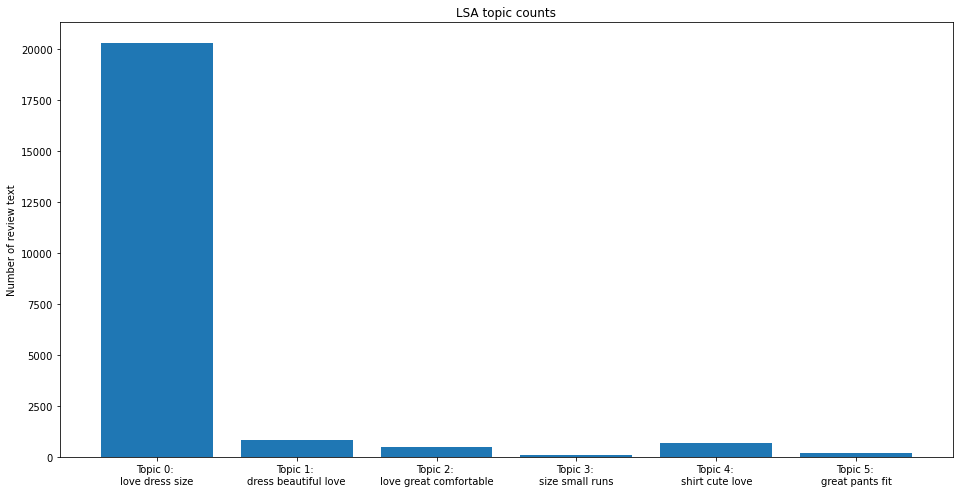

In [123]:
top_3_words = get_top_n_words(3, lsa_keys, document_term_matrix, tfidf_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lsa_categories]
fig, ax = plt.subplots(figsize=(16,8))
ax.bar(lsa_categories, lsa_counts);
ax.set_xticks(lsa_categories);
ax.set_xticklabels(labels);
ax.set_ylabel('Number of review text');
ax.set_title('LSA topic counts');
plt.show();

In [124]:
tsne_lsa_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lsa_vectors = tsne_lsa_model.fit_transform(lsa_topic_matrix)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 22641 samples in 0.034s...
[t-SNE] Computed neighbors for 22641 samples in 2.487s...
[t-SNE] Computed conditional probabilities for sample 1000 / 22641
[t-SNE] Computed conditional probabilities for sample 2000 / 22641
[t-SNE] Computed conditional probabilities for sample 3000 / 22641
[t-SNE] Computed conditional probabilities for sample 4000 / 22641
[t-SNE] Computed conditional probabilities for sample 5000 / 22641
[t-SNE] Computed conditional probabilities for sample 6000 / 22641
[t-SNE] Computed conditional probabilities for sample 7000 / 22641
[t-SNE] Computed conditional probabilities for sample 8000 / 22641
[t-SNE] Computed conditional probabilities for sample 9000 / 22641
[t-SNE] Computed conditional probabilities for sample 10000 / 22641
[t-SNE] Computed conditional probabilities for sample 11000 / 22641
[t-SNE] Computed conditional probabilities for sample 12000 / 22641
[t-SNE] Computed conditional probabilities for sa

In [125]:
def get_mean_topic_vectors(keys, two_dim_vectors):
    '''
    returns a list of centroid vectors from each predicted topic category
    '''
    mean_topic_vectors = []
    for t in range(n_topics):
        reviews_in_that_topic = []
        for i in range(len(keys)):
            if keys[i] == t:
                reviews_in_that_topic.append(two_dim_vectors[i])    
        
        reviews_in_that_topic = np.vstack(reviews_in_that_topic) ##
        mean_review_in_that_topic = np.mean(reviews_in_that_topic, axis=0)
        mean_topic_vectors.append(mean_review_in_that_topic)
    return mean_topic_vectors

In [126]:
colormap = np.array([
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5" ])
colormap = colormap[:n_topics]

In [127]:
top_3_words_lsa = get_top_n_words(3, lsa_keys, document_term_matrix, tfidf_vectorizer)
lsa_mean_topic_vectors = get_mean_topic_vectors(lsa_keys, tsne_lsa_vectors)

plot = figure(title='t-SNE Clustering of {} LSA Topics'.format(n_topics), plot_width=700, plot_height=700)
plot.scatter(x=tsne_lsa_vectors[:,0], y=tsne_lsa_vectors[:,1], color=colormap[lsa_keys])

for t in range(n_topics):
    label = Label(x=lsa_mean_topic_vectors[t][0], y=lsa_mean_topic_vectors[t][1], 
                  text=top_3_words_lsa[t], text_color=colormap[t])
    plot.add_layout(label)
    
show(plot)

GlyphRenderer(id='1039', ...)